In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from google.colab import files
files.upload()

In [ ]:
#import all the stuff needed to open and analyze the images down here
import pandas as pd
import statistics as st
import numpy as np
import random
random.seed(21)
np.random.default_rng(seed = 21)

Generator(PCG64) at 0x791861BBAF80

In [ ]:
#retrieving all images
import glob

folder_path = '/content/drive/MyDrive/LODICITYOFWA198'
img_files = glob.glob(folder_path + '/*.tif')

In [ ]:
#to differentiate between irrigable and non-irrigable, look at each channel band in the image (ie BGR, HSV)
#apparently, use NDVI vegetation index (which requires NIR band in the satellite image) as its more accurate than using HSV images to detect grass/trees
#use some random soil index to detect soil

In [ ]:
#read all images to cv2
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

allImages = [cv2.imread(img_path) for img_path in img_files]

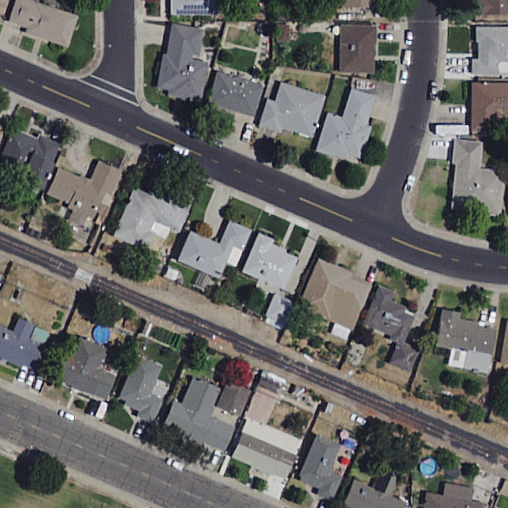

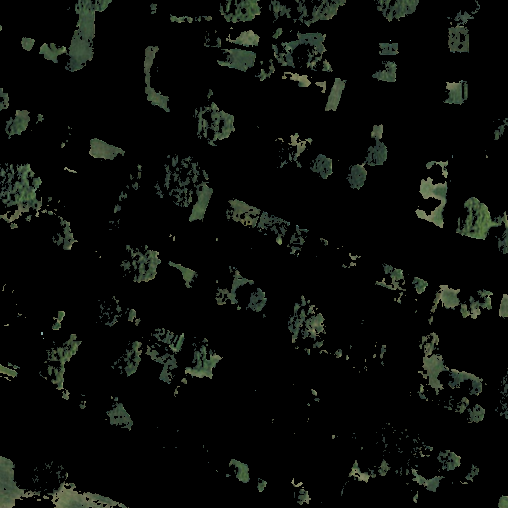

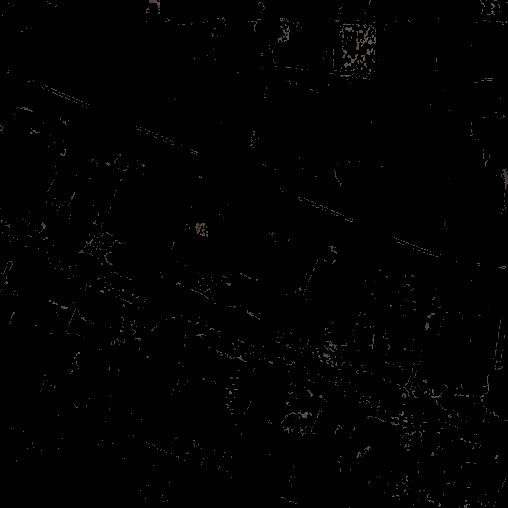

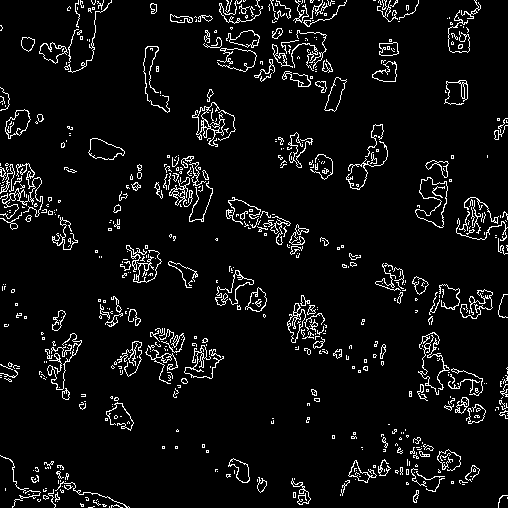

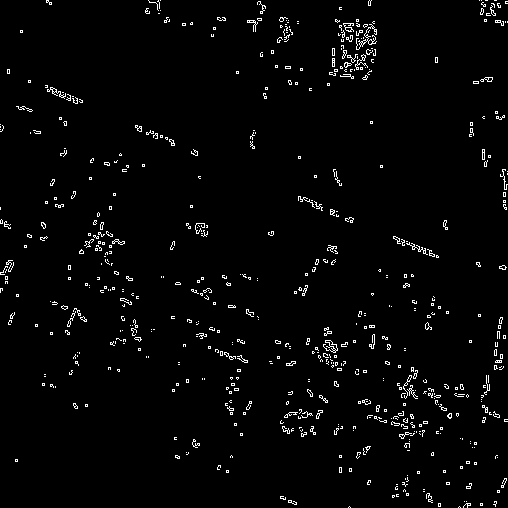

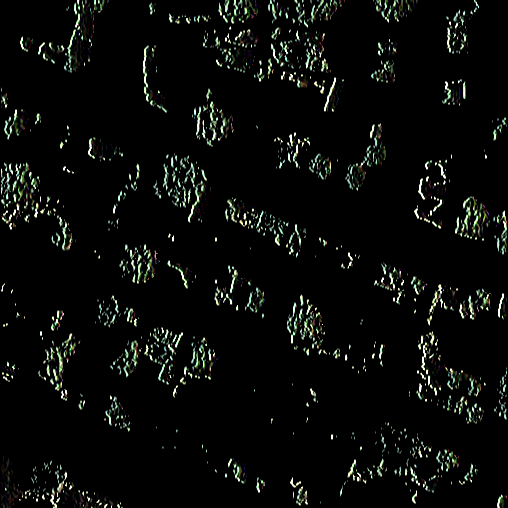

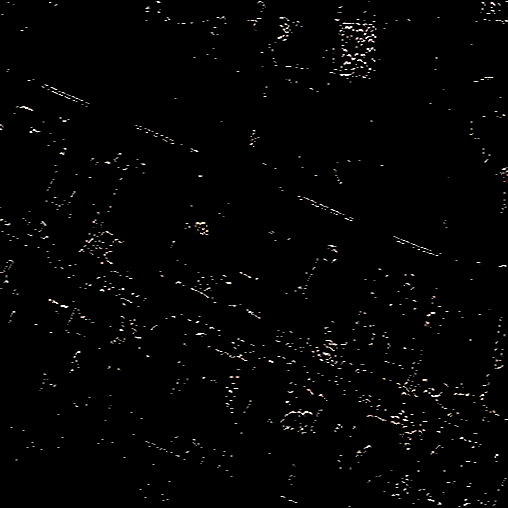

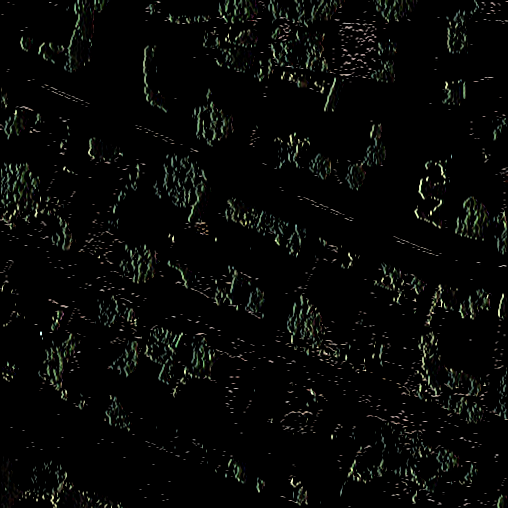

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the image
# img = cv2.imread('18_Lodi_1FT_Albers_1137.tif')
img = allImages[148]

# Convert the image to HSV color space
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Define color thresholds for grass and soil in HSV color space
grass_lower = np.array([30, 50, 50])
grass_upper = np.array([90, 255, 255])
soil_lower = np.array([0, 0, 0])
soil_upper = np.array([20, 255, 100])

# Apply color segmentation to extract grass and soil regions
grass_mask = cv2.inRange(hsv, grass_lower, grass_upper)
soil_mask = cv2.inRange(hsv, soil_lower, soil_upper)
grass = cv2.bitwise_and(img, img, mask=grass_mask)
soil = cv2.bitwise_and(img, img, mask=soil_mask)

# Apply edge detection to grass and soil regions
edges_grass = cv2.Canny(grass, 100, 200)
edges_soil = cv2.Canny(soil, 100, 200)

# Apply texture analysis using the Sobel operator to detect edges
sobel_x = cv2.Sobel(grass, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(soil, cv2.CV_64F, 0, 1, ksize=3)
edges_sobel = cv2.addWeighted(sobel_x, 0.5, sobel_y, 0.5, 0)

# Display the results
cv2_imshow(img)
cv2_imshow(grass)
cv2_imshow(soil)
cv2_imshow(edges_grass)
cv2_imshow(edges_soil)
cv2_imshow(sobel_x)
cv2_imshow(sobel_y)
cv2_imshow(edges_sobel)

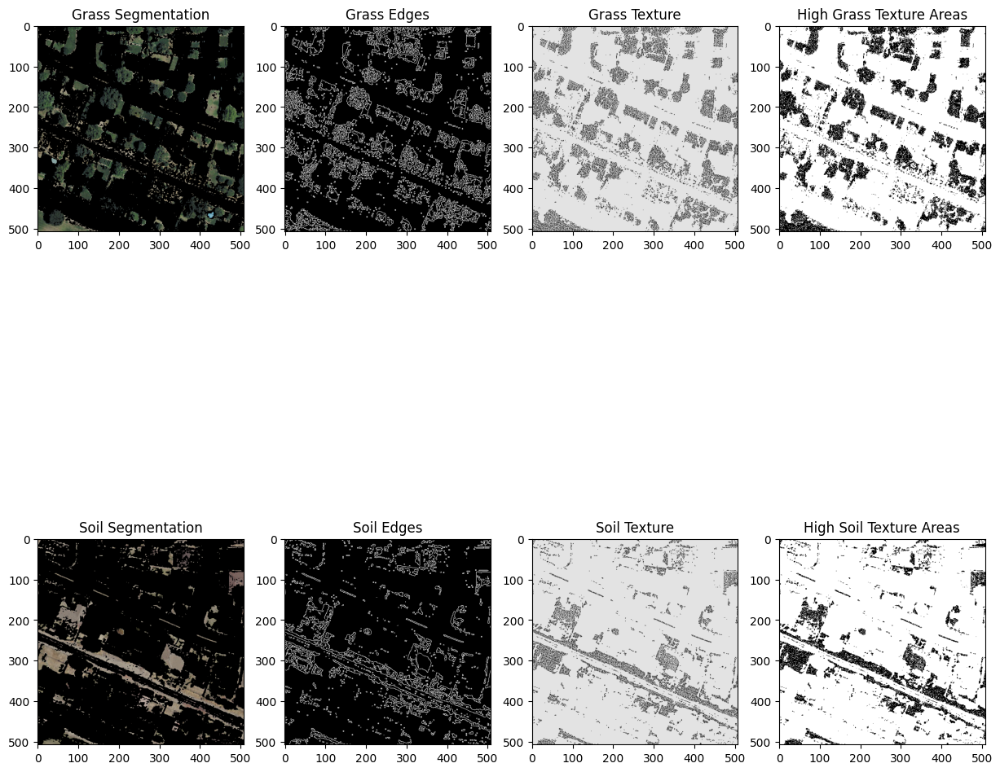

In [ ]:
import cv2
import numpy as np
from skimage import feature
import matplotlib.pyplot as plt

# Load image
# image = cv2.imread('18_Lodi_1FT_Albers_1137.tif')
image = allImages[148]
# Convert image from BGR to HSV
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define range for grass color in HSV
lower_green = np.array([20, 30, 30])
upper_green = np.array([100, 255, 255])

# Define range for soil color in HSV
lower_soil = np.array([0, 30, 30])
upper_soil = np.array([30, 255, 255])

# Threshold the HSV image to get only grass colors
mask_grass = cv2.inRange(hsv, lower_green, upper_green)

# Threshold the HSV image to get only soil colors
mask_soil = cv2.inRange(hsv, lower_soil, upper_soil)

# Bitwise-AND mask and original image (this is what outputs green/black instead of the typical white/black)
res_grass = cv2.bitwise_and(image, image, mask=mask_grass)
res_soil = cv2.bitwise_and(image, image, mask=mask_soil)

# Convert to grayscale for edge detection and texture analysis
gray_grass = cv2.cvtColor(res_grass, cv2.COLOR_BGR2GRAY)
gray_soil = cv2.cvtColor(res_soil, cv2.COLOR_BGR2GRAY)

# Edge detection
edges_grass = cv2.Canny(gray_grass, 30, 100)
edges_soil = cv2.Canny(gray_soil, 30, 100)

# Texture analysis using Local Binary Pattern (LBP)
radius = 1
n_points = 8 * radius
lbp_grass = feature.local_binary_pattern(gray_grass, n_points, radius, method="uniform")
lbp_soil = feature.local_binary_pattern(gray_soil, n_points, radius, method="uniform")
grass_texture = cv2.inRange(lbp_grass, np.percentile(lbp_grass, 75), np.max(lbp_grass))
soil_texture = cv2.inRange(lbp_soil, np.percentile(lbp_soil, 75), np.max(lbp_soil))

# Show images
plt.figure(figsize=(15, 15))
plt.subplot(241), plt.imshow(cv2.cvtColor(res_grass, cv2.COLOR_BGR2RGB)), plt.title('Grass Segmentation')
plt.subplot(242), plt.imshow(edges_grass, cmap='gray'), plt.title('Grass Edges')
plt.subplot(243), plt.imshow(lbp_grass, cmap='gray'), plt.title('Grass Texture')
plt.subplot(244), plt.imshow(grass_texture, cmap='gray'), plt.title('High Grass Texture Areas')
plt.subplot(245), plt.imshow(cv2.cvtColor(res_soil, cv2.COLOR_BGR2RGB)), plt.title('Soil Segmentation')
plt.subplot(246), plt.imshow(edges_soil, cmap='gray'), plt.title('Soil Edges')
plt.subplot(247), plt.imshow(lbp_soil, cmap='gray'), plt.title('Soil Texture')
plt.subplot(248), plt.imshow(soil_texture, cmap='gray'), plt.title('High Soil Texture Areas')
plt.show()

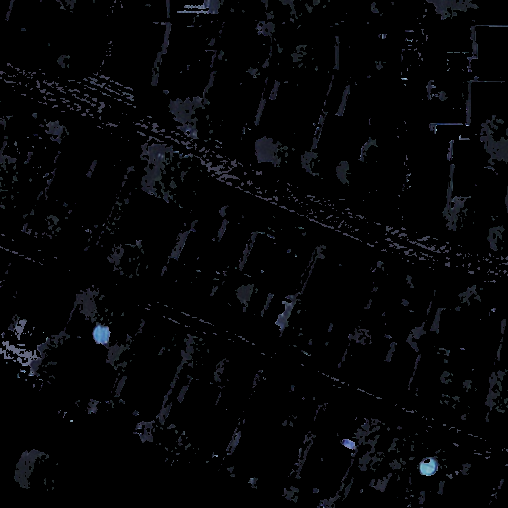

In [ ]:
#change S to 100 if you cannot get shadow detection to work
lower_blue = np.array([90,50,20])
upper_blue = np.array([130,255,255])

# Threshold the HSV image to get only blue colors
mask_water = cv2.inRange(hsv, lower_blue, upper_blue)

# Bitwise-AND mask and original image
resultingMask = cv2.bitwise_and(img, img, mask=mask_water)
cv2_imshow(resultingMask)

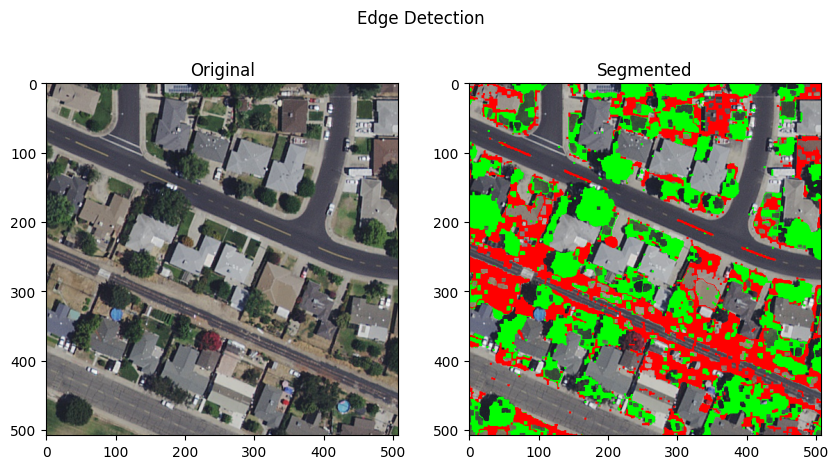

In [ ]:
# Draw contours on the original image
imgCopy1 = np.copy(image)
imgCopy2 = np.copy(image)
contours, _ = cv2.findContours(edges_grass.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contour_img = cv2.drawContours(imgCopy1, contours, -1, (0,255,0), thickness=cv2.FILLED)

contoursSoil, _ = cv2.findContours(edges_soil.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contourSoil_img = cv2.drawContours(imgCopy2, contoursSoil, -1, (0,0,255), thickness=cv2.FILLED)

maskContourGrass = cv2.inRange(contour_img, np.array([0,255,0]), np.array([0,255,0]))
maskContourSoil = cv2.inRange(contourSoil_img, np.array([0,0,255]), np.array([0,0,255]))

# Perform the closing operation
kernel = np.ones((5,5), np.uint8)
closingGrass = cv2.morphologyEx(maskContourGrass, cv2.MORPH_CLOSE, kernel)
closingSoil = cv2.morphologyEx(maskContourSoil, cv2.MORPH_CLOSE, kernel)

combined = np.copy(image)
combined[(closingGrass == 255)] = [0, 255, 0]
combined[(closingSoil == 255)] = [0, 0, 255]

plt.figure(figsize=(10, 10))
plt.suptitle("Edge Detection")
plt.subplots_adjust(top=1.35)
plt.subplot(1, 2, 1), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(1, 2, 2), plt.imshow(cv2.cvtColor(combined, cv2.COLOR_BGR2RGB)), plt.title('Segmented')
plt.show()


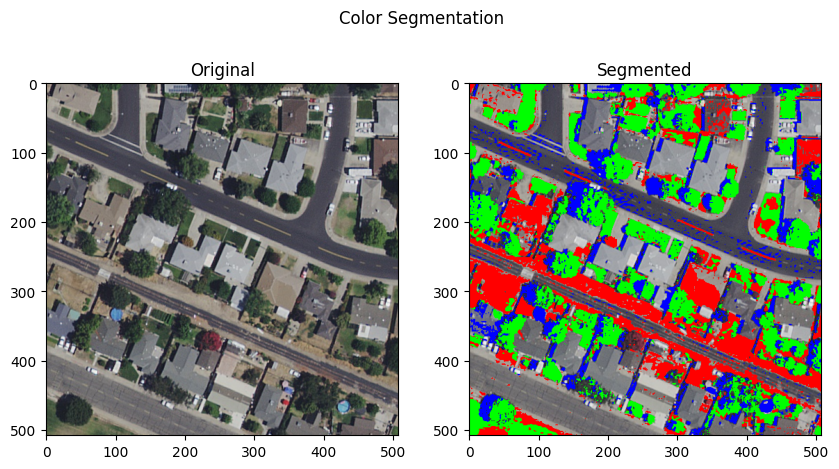

In [ ]:
#annotating original image (ask chat gpt why soil_texture is all over the map...all pink) try to see which one of these three I need to use (edge, texture, color)
#print out grass and soil texture mask matrices to make sure they are marking the proper things (they might be reversed because all the soil is marked as grass (orange))

imageCopy = np.copy(image)

imageCopy[(mask_grass == 255)] = [0, 255, 0]
imageCopy[(mask_soil == 255)] = [0, 0, 255]
imageCopy[(mask_water == 255)] = [255, 0, 0]
# imageCopy[(mask_grass == 255)] = [0, 255, 0]
# imageCopy[(mask_soil == 255)] = [0, 0, 255]

# imageCopy[edges_grass == 255] = [255, 0, 0]
# imageCopy[edges_soil == 255] = [255, 255, 255]
# imageCopy[grass_texture == 255] = [17, 185, 241]
# imageCopy[soil_texture == 255] = [196, 17, 242]

plt.figure(figsize=(10, 10))
plt.suptitle("Color Segmentation")
plt.subplots_adjust(top=1.35)
plt.subplot(1, 2, 1), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(1, 2, 2), plt.imshow(cv2.cvtColor(imageCopy, cv2.COLOR_BGR2RGB)), plt.title('Segmented')
plt.show()

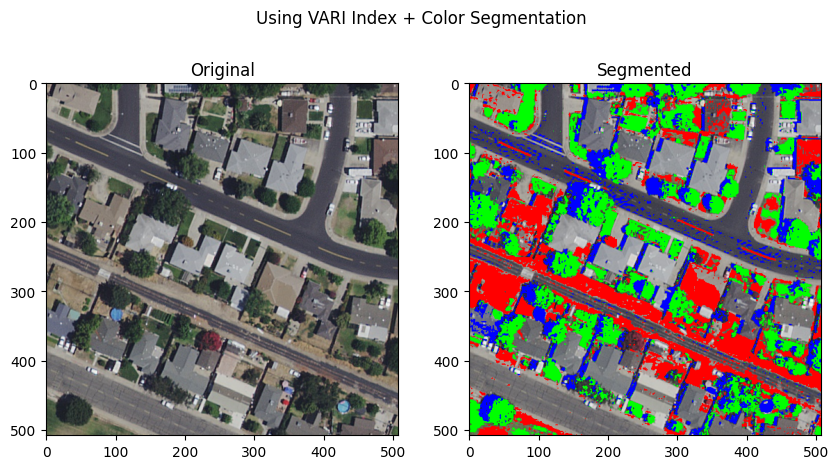

In [ ]:
#Compute VARI index (>0,1 means it is vegetation) -> use "variImage", not "imageCopy" or "image"
#use color+edge detection for soil

variImage = np.copy(image).astype(np.float32)
variImage /= 255
blue, green, red = cv2.split(variImage)

# Calculate VARI
np.seterr(divide='ignore', invalid='ignore')
vari = (green - red) / (green + red - blue)
NDSI = (green - blue) / (green + blue)

# Save the resulting VARI image

# Display the VARI image
variImage[(vari > 0.1)] = [0, 255, 0]
variImage[(mask_soil == 255)] = [0, 0, 255]

#use this if the soil in the middle is actually pavements
#variImage[(NDSI > 0.1)] = [0,0,255]
variImage[(mask_water == 255)] = [255, 0, 0]

plt.figure(figsize=(10, 10))
plt.suptitle("Using VARI Index + Color Segmentation")
plt.subplots_adjust(top=1.35)
plt.subplot(1, 2, 1), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(1, 2, 2), plt.imshow(cv2.cvtColor(variImage, cv2.COLOR_BGR2RGB)), plt.title('Segmented')
plt.show()

In [ ]:
#Erosion and dilation on image to remove small spots
kernel = np.ones((5,5),np.uint8)

# Using cv2.MORPH_OPEN to perform opening, erosion followed by dilation
mask_water_updated = cv2.morphologyEx(mask_water, cv2.MORPH_OPEN, kernel)
mask_soil_updated = cv2.morphologyEx(mask_soil, cv2.MORPH_OPEN, kernel)

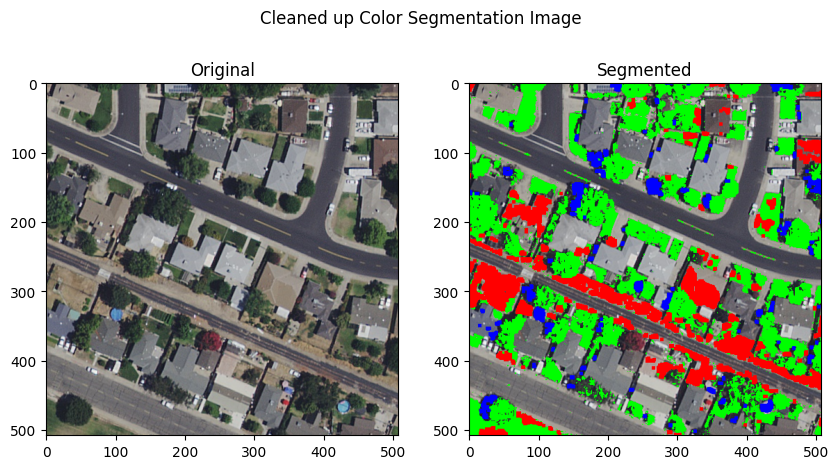

In [ ]:
EDImage = np.copy(image)

EDImage[(mask_grass == 255)] = [0, 255, 0]
EDImage[(mask_soil_updated == 255)] = [0, 0, 255]
EDImage[(mask_water_updated == 255)] = [255, 0, 0]

plt.figure(figsize=(10, 10))
plt.suptitle("Cleaned up Color Segmentation Image")
plt.subplots_adjust(top=1.35)
plt.subplot(1, 2, 1), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(1, 2, 2), plt.imshow(cv2.cvtColor(EDImage, cv2.COLOR_BGR2RGB)), plt.title('Segmented')
plt.show()

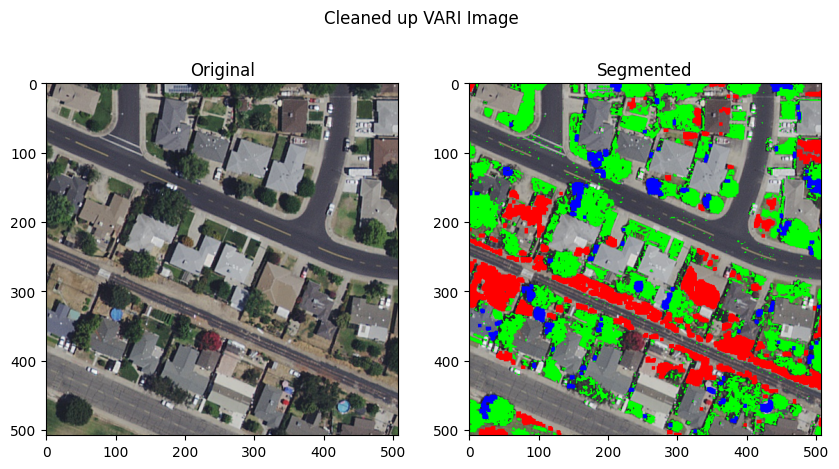

In [ ]:
EDImage2 = np.copy(image).astype(np.float32)

EDImage2 /= 255
blue, green, red = cv2.split(EDImage2)

# Calculate VARI
np.seterr(divide='ignore', invalid='ignore')
vari = (green - red) / (green + red - blue)

EDImage2[(vari > 0.1)] = [0, 255, 0]
EDImage2[(mask_soil_updated == 255)] = [0, 0, 255]
EDImage2[(mask_water_updated == 255)] = [255, 0, 0]

plt.figure(figsize=(10, 10))
plt.suptitle("Cleaned up VARI Image")
plt.subplots_adjust(top=1.35)
plt.subplot(1, 2, 1), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(1, 2, 2), plt.imshow(cv2.cvtColor(EDImage2, cv2.COLOR_BGR2RGB)), plt.title('Segmented')
plt.show()

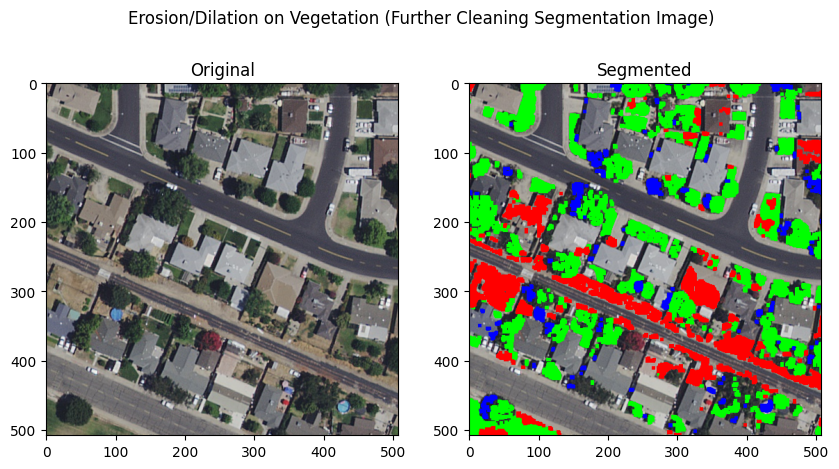

In [ ]:
#erosion/dilation on segmentation mask (grass index)
EDWithGrassImage = np.copy(image)

mask_grass_updated = cv2.morphologyEx(mask_grass, cv2.MORPH_OPEN, kernel)

#display the image with erosion/dilation on water and soil and grass masks
EDWithGrassImage[(mask_grass_updated == 255)] = [0, 255, 0]
EDWithGrassImage[(mask_soil_updated == 255)] = [0, 0, 255]
EDWithGrassImage[(mask_water_updated == 255)] = [255, 0, 0]

plt.figure(figsize=(10, 10))
plt.suptitle("Erosion/Dilation on Vegetation (Further Cleaning Segmentation Image)")
plt.subplots_adjust(top=1.35)
plt.subplot(1, 2, 1), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(1, 2, 2), plt.imshow(cv2.cvtColor(EDWithGrassImage, cv2.COLOR_BGR2RGB)), plt.title('Segmented')
plt.show()

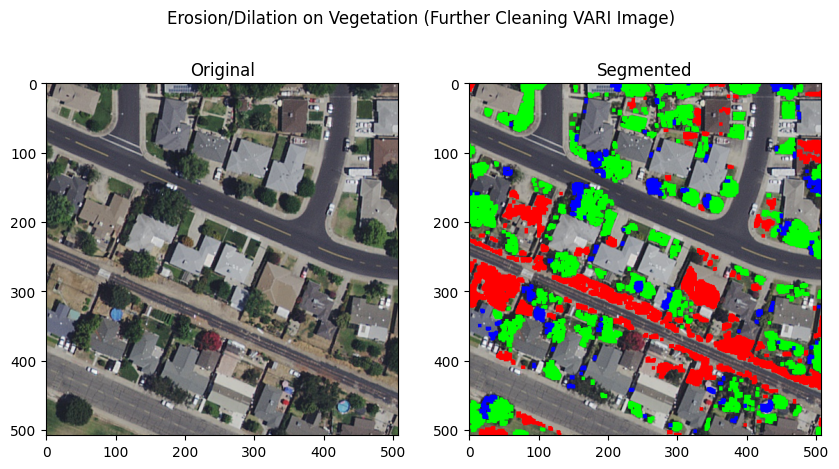

In [ ]:
#erosion/dilation on vari mask (grass index)
EDWithGrassImage2 = np.copy(image).astype(np.float32)
EDWithGrassImage2 /= 255
blue, green, red = cv2.split(EDWithGrassImage2)

# Calculate VARI
np.seterr(divide='ignore', invalid='ignore')
vari = (green - red) / (green + red - blue)

binaryGrassMatrix = (vari > 0.1).astype(np.uint8)
binaryGrassMatrix *= 255
mask_grass_updated = cv2.morphologyEx(binaryGrassMatrix, cv2.MORPH_OPEN, kernel)

#display the image with erosion/dilation on water and soil and grass masks
EDWithGrassImage2[(mask_grass_updated == 255)] = [0, 255, 0]
EDWithGrassImage2[(mask_soil_updated == 255)] = [0, 0, 255]
EDWithGrassImage2[(mask_water_updated == 255)] = [255, 0, 0]

plt.figure(figsize=(10, 10))
plt.suptitle("Erosion/Dilation on Vegetation (Further Cleaning VARI Image)")
plt.subplots_adjust(top=1.35)
plt.subplot(1, 2, 1), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(1, 2, 2), plt.imshow(cv2.cvtColor(EDWithGrassImage2, cv2.COLOR_BGR2RGB)), plt.title('Segmented')
plt.show()

In [ ]:
#computing percentage of image that consists of grass and soil (use image and variImage/imageCopy)

import numpy as np

totalPixels = 0
pixelsSoilOrGrassOrWater = 0
grassCode = [0,255,0]
soilCode = [0,0,255]
waterCode = [255,0,0]

imageToCompare = EDImage

for i in imageToCompare:
  for j in i:
    if (np.array_equal(j, grassCode)) or (np.array_equal(j, soilCode)) or (np.array_equal(j, waterCode)):
      pixelsSoilOrGrassOrWater += 1
    totalPixels += 1

print(pixelsSoilOrGrassOrWater, totalPixels)
print(pixelsSoilOrGrassOrWater / totalPixels)


91649 258064
0.35514058528117054


In [ ]:
#Ask what are the next steps....how to use the results of these images to analyze and compute the area of the images and etc...
#ask if i need to use AI/ML or did these indexes accurately capture the grass/soil in these images
#Show all of these results and then talk m ML methods if necessary

In [ ]:
#1: Shadow detection (1 possible way: Use HSV and then create 4 masks: low S, RMax, GMax, BMax...then use decision tree+statistics to analyze)..refer to IEEE article
'''2: Another way: Use YCbCR color space and do some gaussian smoothing on rgb images to remove noise...then annotate the current images using a shadow detection software
...then use an SVM to supervise learn the training dataset I created (this is complex because I got to annotate data)'''

'2: Another way: Use YCbCR color space and do some gaussian smoothing on rgb images to remove noise...then annotate the current images using a shadow detection software\n...then use an SVM to supervise learn the training dataset I created (this is complex because I got to annotate data)'

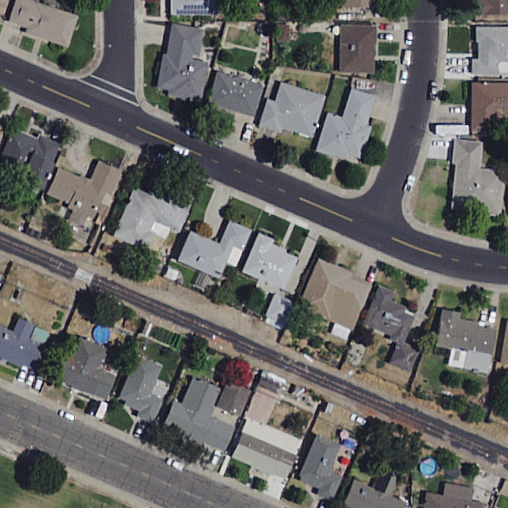

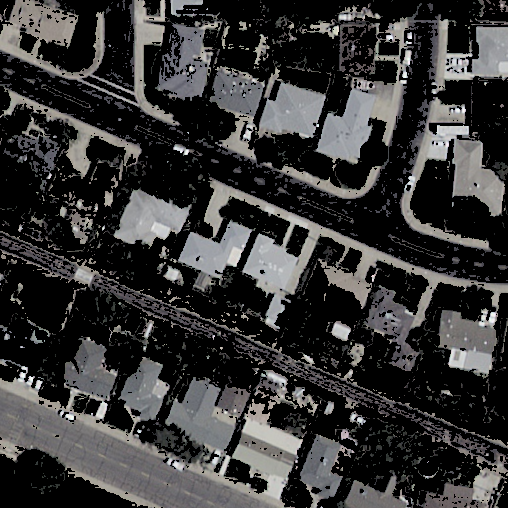

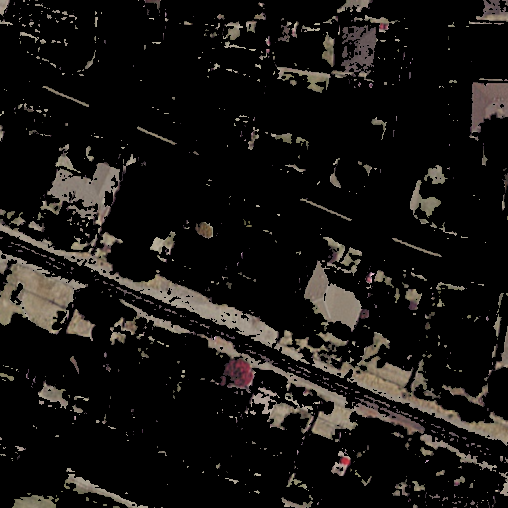

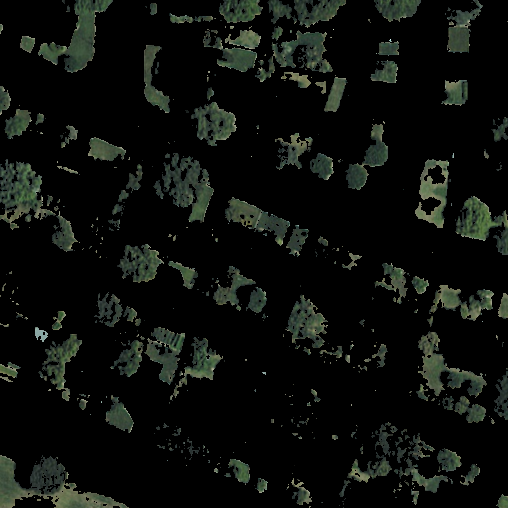

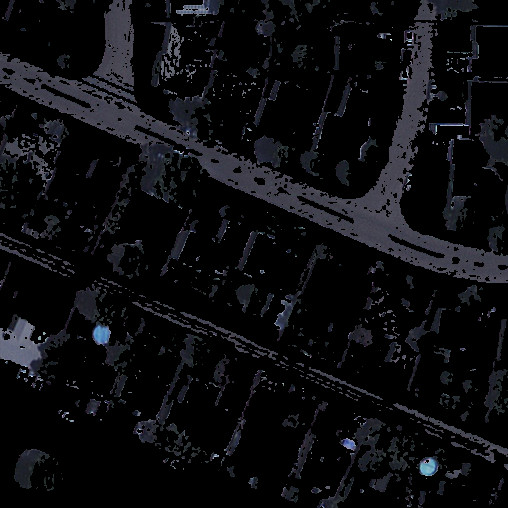

In [ ]:
#Shadow detection combined with EDImage (Cleaned up water and soil, but not vegetation. Also uses color segmentation for vegetation, not VARI)

#low saturation (LS) upper bound = 25-30 (play around with individual values)
#lets label true values as white (1 or 255)...compute the MR, MG, MB masks solely based on the LS mask (only use pixels where LS = 0)

#LS mask
shadowDetectedImage = np.copy(image)
hsvImg = cv2.cvtColor(shadowDetectedImage, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsvImg)
b, g, r = cv2.split(shadowDetectedImage)

LS_mask = cv2.inRange(s, 0, 30)

#RGB Max Masks
rMaxMask = ((r == shadowDetectedImage.max(axis=2)) & (LS_mask == 0)).astype(np.uint8) * 255
gMaxMask = ((g == shadowDetectedImage.max(axis=2)) & (LS_mask == 0)).astype(np.uint8) * 255
bMaxMask = ((b == shadowDetectedImage.max(axis=2)) & (LS_mask == 0)).astype(np.uint8) * 255

cv2_imshow(shadowDetectedImage)
cv2_imshow(cv2.bitwise_and(shadowDetectedImage, shadowDetectedImage, mask=LS_mask))
cv2_imshow(cv2.bitwise_and(shadowDetectedImage, shadowDetectedImage, mask=rMaxMask))
cv2_imshow(cv2.bitwise_and(shadowDetectedImage, shadowDetectedImage, mask=gMaxMask))
cv2_imshow(cv2.bitwise_and(shadowDetectedImage, shadowDetectedImage, mask=bMaxMask))

In [ ]:
#0 = red, 1 = green, 2 = blue

def findFConstant(mean, SD, SDDivByMean, skewness, color):
  if mean < 100:
    if skewness < -1:
      if SDDivByMean < 0.2:
        if color == 2:
          return -SD / 2
        else:
          return 2 * SD
      elif SDDivByMean < 0.5:
        if color == 2:
          return -SD
        else:
          return SD
      elif SDDivByMean <= 1:
        if color == 2:
          return -2 * SD
        else:
          return SD / 2
      else:
        return SD

    elif skewness < 0.5:
      if color == 2:
        return -(SD**2)/mean
      else:
        return (SD**2)/mean

    elif skewness < 1:
      if color == 2:
        return -(SD**2)/mean
      else:
        return 0

    else:
      if SDDivByMean < 0.2:
        if color == 0:
          return 2 * SD
        else:
          return -2 * SD
      elif SDDivByMean < 0.5:
        if color == 0:
          return SD
        else:
          return -SD
      elif SDDivByMean <= 1:
        if color == 2:
          return -1.2 * SD
        elif color == 1:
          return -SD / 2
        else:
          return SD / 2
      else:
        return SD
  else:
    if skewness < -1 or skewness >= 1:
      if SDDivByMean < 0.2:
        return 2 * SD
      elif SDDivByMean < 0.5:
        return SD
      elif SDDivByMean <= 1:
        return SD / 2
      else:
        return SD

    elif skewness < -0.5:
      return (SD**2)/mean

    elif skewness < 0:
      if color == 0:
        return (SD**2)/mean
      else:
        return 1.2 * SD

    elif skewness < 0.5:
      return 2 * SD

    else:
      if SDDivByMean < 0.2:
        if color == 2:
          return 1.5 * SD
        else:
          return 2 * SD
      elif SDDivByMean < 0.5:
        if color == 2:
          return SD
        else:
          return 1.5 * SD
      elif SDDivByMean <= 1:
        if color == 2:
          return 0.5 * SD
        else:
          return SD
      else:
        return SD

In [ ]:
#Value channel analysis (mean, SD, skewness)

v_r_mask = cv2.bitwise_and(v, rMaxMask)
v_g_mask = cv2.bitwise_and(v, gMaxMask)
v_b_mask = cv2.bitwise_and(v, bMaxMask)

#Calculate those three statistics for each of the three channels (R, G, and B)

#R channel value statistic computation
non_zero_pixels = v_r_mask[rMaxMask != 0]
x_r = np.mean(non_zero_pixels)
s_r = np.std(non_zero_pixels)

n = len(non_zero_pixels)
sk_r = (1/n) * np.sum(((non_zero_pixels.flatten() - x_r) / s_r) ** 3)
print(x_r, s_r/x_r, sk_r)



#G channel value statistic computation
non_zero_pixels = v_g_mask[gMaxMask != 0]
x_g = np.mean(non_zero_pixels)
s_g = np.std(non_zero_pixels)

n = len(non_zero_pixels)
sk_g = (1/n) * np.sum(((non_zero_pixels.flatten() - x_g) / s_g) ** 3)
print(x_g, s_g/x_g, sk_g)

#B channel value statistic computation
non_zero_pixels = v_b_mask[bMaxMask != 0]
x_b = np.mean(non_zero_pixels)
s_b = np.std(non_zero_pixels)

n = len(non_zero_pixels)
sk_b = (1/n) * np.sum(((non_zero_pixels.flatten() - x_b) / s_b) ** 3)
print(x_b, s_b/x_b, sk_b)


#LS channel value statistic computation
# non_zero_pixels = v_b_mask[v_b_mask != 0]
# x_b = np.mean(non_zero_pixels)
# s_b = np.std(non_zero_pixels)

# n = len(non_zero_pixels)
# sk_b = (1/n) * np.sum(((non_zero_pixels.flatten() - x_b) / s_b) ** 3)
# print(x_b, s_b/x_b, sk_b)

132.30272132761408 0.21509759014877 -0.8681961875227228
79.68484836099076 0.29591112048892243 0.6410618993882925
68.70572327578876 0.3897253023386324 1.3687569689100523


In [ ]:
#Computing f-constant
fRed = findFConstant(x_r, s_r, s_r/x_r, sk_r, 0)
fGreen = findFConstant(x_g, s_g, s_g/x_g, sk_g, 1)
fBlue = findFConstant(x_b, s_b, s_b/x_b, sk_b, 2)

#applying all this statistical analysis to actually detect the shadows
redMaskShadows = np.zeros_like(v_r_mask)
redMaskShadows[rMaxMask != 0] = np.where(v_r_mask[rMaxMask != 0] < (x_r - fRed), 1, 0)

greenMaskShadows = np.zeros_like(v_g_mask)
greenMaskShadows[gMaxMask != 0] = np.where(v_g_mask[gMaxMask != 0] < (x_g - fGreen), 1, 0)

blueMaskShadows = np.zeros_like(v_b_mask)
blueMaskShadows[bMaxMask != 0] = np.where(v_b_mask[bMaxMask != 0] < (x_b - fBlue), 1, 0)

LSMaskShadows = np.zeros_like(LS_mask)
LSMaskShadows[LS_mask != 0] = np.where((v[LS_mask != 0] < 15) & (v[LS_mask != 0] > 5), 1, 0)

print(sum(sum(redMaskShadows)), sum(sum(greenMaskShadows)), sum(sum(blueMaskShadows)), sum(sum(LSMaskShadows)))

14642 26516 53737 0


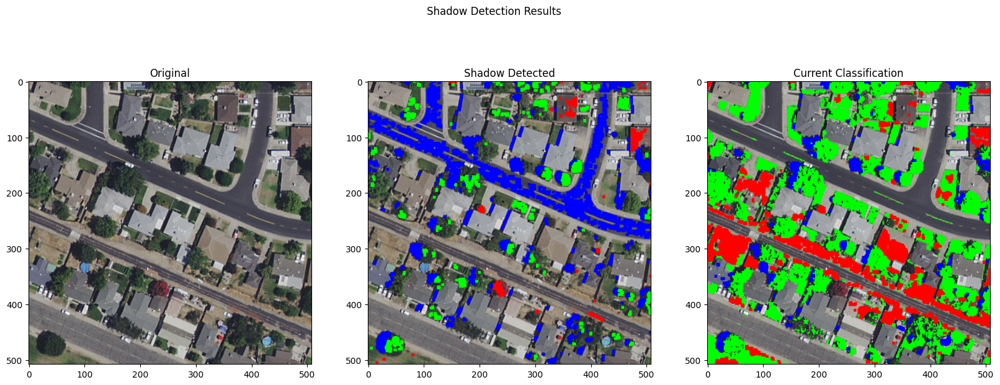

In [ ]:
#Displaying the shadow detection results

imageWithShadowDetection = np.copy(image)

#erosion/dilation on shadow detection
kernel = np.ones((5,5),np.uint8)

# Using cv2.MORPH_OPEN to perform opening, erosion followed by dilation
redMaskShadowsUpdated = cv2.morphologyEx(redMaskShadows, cv2.MORPH_OPEN, kernel)
greenMaskShadowsUpdated = cv2.morphologyEx(greenMaskShadows, cv2.MORPH_OPEN, kernel)
blueMaskShadowsUpdated = cv2.morphologyEx(blueMaskShadows, cv2.MORPH_OPEN, kernel)
LSMaskShadowsUpdated = cv2.morphologyEx(LSMaskShadows, cv2.MORPH_OPEN, kernel)

imageWithShadowDetection[(redMaskShadowsUpdated == 1)] = [0, 0, 255]
imageWithShadowDetection[(greenMaskShadowsUpdated == 1)] = [0, 255, 0]
imageWithShadowDetection[(blueMaskShadowsUpdated == 1)] = [255, 0, 0]
imageWithShadowDetection[(LSMaskShadowsUpdated == 1)] = [255, 255, 255]

plt.figure(figsize=(20, 20))
plt.suptitle("Shadow Detection Results")
plt.subplots_adjust(top=1.5)
plt.subplot(1, 3, 1), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(1, 3, 2), plt.imshow(cv2.cvtColor(imageWithShadowDetection, cv2.COLOR_BGR2RGB)), plt.title('Shadow Detected')
plt.subplot(1, 3, 3), plt.imshow(cv2.cvtColor(EDImage, cv2.COLOR_BGR2RGB)), plt.title('Current Classification')
plt.show()

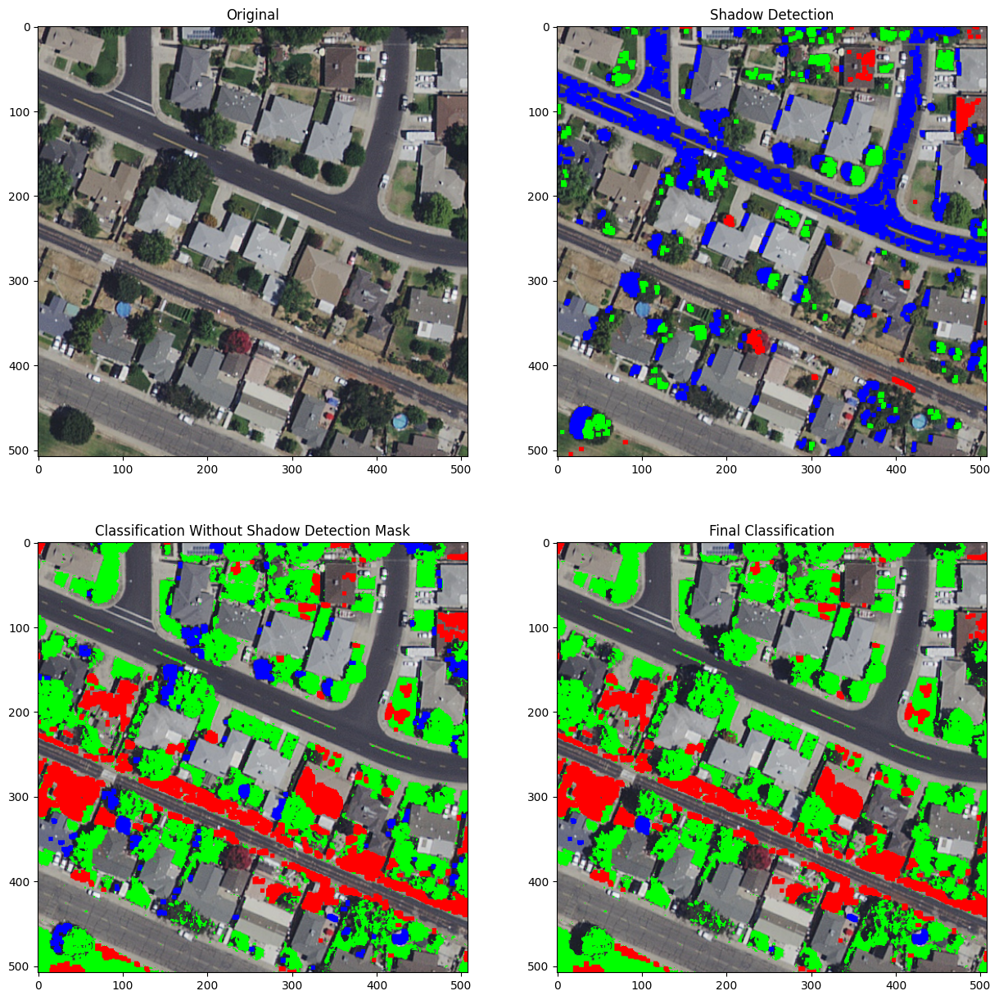

In [ ]:
#shadow detection results for GREEN/LSMask is not that accurate (Try scaling all the HSV values then trying again...scale them between 0-1, use z-formula normalization)
#Not sure about normalizaiton, do more research (LSMask is useless because all the values are greater than 15....maybe modify that threshold too)

#Resulting image with shadow detection (Exclude the green shadow detection for now)

finalImage = np.copy(image)
#order: Grass, soil, water
finalGrassMask = cv2.bitwise_and(mask_grass, mask_grass)
finalSoilMask = cv2.bitwise_and(cv2.bitwise_not(redMaskShadowsUpdated * 255), mask_soil_updated)
finalWaterMask = cv2.bitwise_and(cv2.bitwise_not(blueMaskShadowsUpdated * 255), mask_water_updated)
# finalGrassMask = cv2.bitwise_and(cv2.bitwise_not(greenMaskShadowsUpdated * 255), mask_grass)

#Another erosion/dilation on soil and water masks
kernel = np.ones((5,5),np.uint8)

# Using cv2.MORPH_OPEN to perform opening, erosion followed by dilation
finalWaterMask = cv2.morphologyEx(finalWaterMask, cv2.MORPH_OPEN, kernel)
finalSoilMask = cv2.morphologyEx(finalSoilMask, cv2.MORPH_OPEN, kernel)

#Using color segmentation image
finalImage[finalGrassMask == 255] = [0, 255, 0]
finalImage[finalSoilMask == 255] = [0, 0, 255]
finalImage[finalWaterMask == 255] = [255, 0, 0]

#Using VARI image
# finalImage[(vari > 0.1)] = [0, 255, 0]
# finalImage[finalSoilMask == 255] = [0, 0, 255]
# finalImage[finalWaterMask == 255] = [255, 0, 0]

plt.figure(figsize=(15, 15))
plt.subplot(2, 2, 1), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
plt.subplot(2, 2, 2), plt.imshow(cv2.cvtColor(imageWithShadowDetection, cv2.COLOR_BGR2RGB)), plt.title('Shadow Detection')
plt.subplot(2, 2, 3), plt.imshow(cv2.cvtColor(EDImage, cv2.COLOR_BGR2RGB)), plt.title('Classification Without Shadow Detection Mask')
plt.subplot(2, 2, 4), plt.imshow(cv2.cvtColor(finalImage, cv2.COLOR_BGR2RGB)), plt.title('Final Classification')
plt.show()

In [ ]:
#Export/download all the 1k+ images (finalImages) after running them on the color segmentation and shadow detection
import cv2
import numpy as np
from skimage import feature
import matplotlib.pyplot as plt

def runProgram(image):
  # Load image
  # image = cv2.imread('18_Lodi_1FT_Albers_1137.tif')
  # image = allImages[148]

  # Convert image from BGR to HSV
  hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

  # Define range for grass color in HSV
  lower_green = np.array([20, 30, 30])
  upper_green = np.array([100, 255, 255])

  # Define range for soil color in HSV
  lower_soil = np.array([0, 30, 30])
  upper_soil = np.array([30, 255, 255])

  # Threshold the HSV image to get only grass colors
  mask_grass = cv2.inRange(hsv, lower_green, upper_green)

  # Threshold the HSV image to get only soil colors
  mask_soil = cv2.inRange(hsv, lower_soil, upper_soil)

  # Bitwise-AND mask and original image (this is what outputs green/black instead of the typical white/black)
  res_grass = cv2.bitwise_and(image, image, mask=mask_grass)
  res_soil = cv2.bitwise_and(image, image, mask=mask_soil)

  # Convert to grayscale for edge detection and texture analysis
  gray_grass = cv2.cvtColor(res_grass, cv2.COLOR_BGR2GRAY)
  gray_soil = cv2.cvtColor(res_soil, cv2.COLOR_BGR2GRAY)

  # Edge detection
  edges_grass = cv2.Canny(gray_grass, 30, 100)
  edges_soil = cv2.Canny(gray_soil, 30, 100)

  lower_blue = np.array([90,50,20])
  upper_blue = np.array([130,255,255])

  # Threshold the HSV image to get only blue colors
  mask_water = cv2.inRange(hsv, lower_blue, upper_blue)

  #Edge detection image -> "combined"
  imgCopy1 = np.copy(image)
  imgCopy2 = np.copy(image)
  contours, _ = cv2.findContours(edges_grass.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  contour_img = cv2.drawContours(imgCopy1, contours, -1, (0,255,0), thickness=cv2.FILLED)

  contoursSoil, _ = cv2.findContours(edges_soil.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  contourSoil_img = cv2.drawContours(imgCopy2, contoursSoil, -1, (0,0,255), thickness=cv2.FILLED)

  maskContourGrass = cv2.inRange(contour_img, np.array([0,255,0]), np.array([0,255,0]))
  maskContourSoil = cv2.inRange(contourSoil_img, np.array([0,0,255]), np.array([0,0,255]))

  # Perform the closing operation
  kernel = np.ones((5,5), np.uint8)
  closingGrass = cv2.morphologyEx(maskContourGrass, cv2.MORPH_CLOSE, kernel)
  closingSoil = cv2.morphologyEx(maskContourSoil, cv2.MORPH_CLOSE, kernel)

  combined = np.copy(image)
  combined[(closingGrass == 255)] = [0, 255, 0]
  combined[(closingSoil == 255)] = [0, 0, 255]

  #Color segmentation -> "imageCopy"
  imageCopy = np.copy(image)

  imageCopy[(mask_grass == 255)] = [0, 255, 0]
  imageCopy[(mask_soil == 255)] = [0, 0, 255]
  imageCopy[(mask_water == 255)] = [255, 0, 0]

  #Vari image -> "variImage"
  variImage = np.copy(image).astype(np.float32)
  variImage /= 255
  blue, green, red = cv2.split(variImage)

  # Calculate VARI
  np.seterr(divide='ignore', invalid='ignore')
  vari = (green - red) / (green + red - blue)
  NDSI = (green - blue) / (green + blue)

  # Save the resulting VARI image

  # Display the VARI image
  variImage[(vari > 0.1)] = [0, 255, 0]
  variImage[(mask_soil == 255)] = [0, 0, 255]

  #use this if the soil in the middle is actually pavements
  #variImage[(NDSI > 0.1)] = [0,0,255]
  variImage[(mask_water == 255)] = [255, 0, 0]

  kernel = np.ones((5,5),np.uint8)

  # Using cv2.MORPH_OPEN to perform opening, erosion followed by dilation
  mask_water_updated = cv2.morphologyEx(mask_water, cv2.MORPH_OPEN, kernel)
  mask_soil_updated = cv2.morphologyEx(mask_soil, cv2.MORPH_OPEN, kernel)

  #Cleaned color segmentation (most effective method) -> "EDImage"
  EDImage = np.copy(image)

  EDImage[(mask_grass == 255)] = [0, 255, 0]
  EDImage[(mask_soil_updated == 255)] = [0, 0, 255]
  EDImage[(mask_water_updated == 255)] = [255, 0, 0]

  #Cleaned vari image -> "EDImage2"
  EDImage2 = np.copy(image).astype(np.float32)

  EDImage2 /= 255
  blue, green, red = cv2.split(EDImage2)

  # Calculate VARI
  np.seterr(divide='ignore', invalid='ignore')
  vari = (green - red) / (green + red - blue)

  EDImage2[(vari > 0.1)] = [0, 255, 0]
  EDImage2[(mask_soil_updated == 255)] = [0, 0, 255]
  EDImage2[(mask_water_updated == 255)] = [255, 0, 0]

  #erosion/dilation on segmentation mask (grass index)
  EDWithGrassImage = np.copy(image)

  mask_grass_updated = cv2.morphologyEx(mask_grass, cv2.MORPH_OPEN, kernel)

  #display the image with erosion/dilation on water and soil and grass masks
  EDWithGrassImage[(mask_grass_updated == 255)] = [0, 255, 0]
  EDWithGrassImage[(mask_soil_updated == 255)] = [0, 0, 255]
  EDWithGrassImage[(mask_water_updated == 255)] = [255, 0, 0]

  #erosion/dilation on vari mask (grass index)
  EDWithGrassImage2 = np.copy(image).astype(np.float32)
  EDWithGrassImage2 /= 255
  blue, green, red = cv2.split(EDWithGrassImage2)

  # Calculate VARI
  np.seterr(divide='ignore', invalid='ignore')
  vari = (green - red) / (green + red - blue)

  binaryGrassMatrix = (vari > 0.1).astype(np.uint8)
  binaryGrassMatrix *= 255
  mask_grass_updated = cv2.morphologyEx(binaryGrassMatrix, cv2.MORPH_OPEN, kernel)

  #display the image with erosion/dilation on water and soil and grass masks
  EDWithGrassImage2[(mask_grass_updated == 255)] = [0, 255, 0]
  EDWithGrassImage2[(mask_soil_updated == 255)] = [0, 0, 255]
  EDWithGrassImage2[(mask_water_updated == 255)] = [255, 0, 0]

  totalPixels = 0
  pixelsSoilOrGrassOrWater = 0
  grassCode = [0,255,0]
  soilCode = [0,0,255]
  waterCode = [255,0,0]

  imageToCompare = EDImage

  for i in imageToCompare:
    for j in i:
      if (np.array_equal(j, grassCode)) or (np.array_equal(j, soilCode)) or (np.array_equal(j, waterCode)):
        pixelsSoilOrGrassOrWater += 1
      totalPixels += 1

  # print(pixelsSoilOrGrassOrWater, totalPixels)
  # print(pixelsSoilOrGrassOrWater / totalPixels)

  shadowDetectedImage = np.copy(image)
  hsvImg = cv2.cvtColor(shadowDetectedImage, cv2.COLOR_BGR2HSV)
  h, s, v = cv2.split(hsvImg)
  b, g, r = cv2.split(shadowDetectedImage)

  LS_mask = cv2.inRange(s, 0, 30)

  #RGB Max Masks
  rMaxMask = ((r == shadowDetectedImage.max(axis=2)) & (LS_mask == 0)).astype(np.uint8) * 255
  gMaxMask = ((g == shadowDetectedImage.max(axis=2)) & (LS_mask == 0)).astype(np.uint8) * 255
  bMaxMask = ((b == shadowDetectedImage.max(axis=2)) & (LS_mask == 0)).astype(np.uint8) * 255

  #Value channel analysis (mean, SD, skewness)

  v_r_mask = cv2.bitwise_and(v, rMaxMask)
  v_g_mask = cv2.bitwise_and(v, gMaxMask)
  v_b_mask = cv2.bitwise_and(v, bMaxMask)

  #Calculate those three statistics for each of the three channels (R, G, and B)

  #R channel value statistic computation
  non_zero_pixels = v_r_mask[rMaxMask != 0]
  redMaskShadows = np.zeros_like(v_r_mask)
  if (len(non_zero_pixels) > 0):
    x_r = np.mean(non_zero_pixels)
    s_r = np.std(non_zero_pixels)

    n = len(non_zero_pixels)
    sk_r = (1/n) * np.sum(((non_zero_pixels.flatten() - x_r) / s_r) ** 3)
    # print(x_r, s_r/x_r, sk_r)

    fRed = findFConstant(x_r, s_r, s_r/x_r, sk_r, 0)
    redMaskShadows[rMaxMask != 0] = np.where(v_r_mask[rMaxMask != 0] < (x_r - fRed), 1, 0)

  #G channel value statistic computation
  non_zero_pixels = v_g_mask[gMaxMask != 0]
  greenMaskShadows = np.zeros_like(v_g_mask)
  if (len(non_zero_pixels) > 0):
    x_g = np.mean(non_zero_pixels)
    s_g = np.std(non_zero_pixels)

    n = len(non_zero_pixels)
    sk_g = (1/n) * np.sum(((non_zero_pixels.flatten() - x_g) / s_g) ** 3)
    # print(x_g, s_g/x_g, sk_g)

    fGreen = findFConstant(x_g, s_g, s_g/x_g, sk_g, 1)
    greenMaskShadows[gMaxMask != 0] = np.where(v_g_mask[gMaxMask != 0] < (x_g - fGreen), 1, 0)

  #B channel value statistic computation
  non_zero_pixels = v_b_mask[bMaxMask != 0]
  blueMaskShadows = np.zeros_like(v_b_mask)
  if (len(non_zero_pixels) > 0):
    x_b = np.mean(non_zero_pixels)
    s_b = np.std(non_zero_pixels)

    n = len(non_zero_pixels)
    sk_b = (1/n) * np.sum(((non_zero_pixels.flatten() - x_b) / s_b) ** 3)
    # print(x_b, s_b/x_b, sk_b)

    fBlue = findFConstant(x_b, s_b, s_b/x_b, sk_b, 2)
    blueMaskShadows[bMaxMask != 0] = np.where(v_b_mask[bMaxMask != 0] < (x_b - fBlue), 1, 0)

  LSMaskShadows = np.zeros_like(LS_mask)
  LSMaskShadows[LS_mask != 0] = np.where((v[LS_mask != 0] < 15) & (v[LS_mask != 0] > 5), 1, 0)

  # print(sum(sum(redMaskShadows)), sum(sum(greenMaskShadows)), sum(sum(blueMaskShadows)), sum(sum(LSMaskShadows)))

  #Displaying the shadow detection results

  imageWithShadowDetection = np.copy(image)

  #erosion/dilation on shadow detection
  kernel = np.ones((5,5),np.uint8)

  # Using cv2.MORPH_OPEN to perform opening, erosion followed by dilation
  redMaskShadowsUpdated = cv2.morphologyEx(redMaskShadows, cv2.MORPH_OPEN, kernel)
  greenMaskShadowsUpdated = cv2.morphologyEx(greenMaskShadows, cv2.MORPH_OPEN, kernel)
  blueMaskShadowsUpdated = cv2.morphologyEx(blueMaskShadows, cv2.MORPH_OPEN, kernel)
  LSMaskShadowsUpdated = cv2.morphologyEx(LSMaskShadows, cv2.MORPH_OPEN, kernel)

  imageWithShadowDetection[(redMaskShadowsUpdated == 1)] = [0, 0, 255]
  imageWithShadowDetection[(greenMaskShadowsUpdated == 1)] = [0, 255, 0]
  imageWithShadowDetection[(blueMaskShadowsUpdated == 1)] = [255, 0, 0]
  imageWithShadowDetection[(LSMaskShadowsUpdated == 1)] = [255, 255, 255]

  #Resulting image with shadow detection (Exclude the green shadow detection for now)

  finalImage = np.copy(image)
  #order: Grass, soil, water
  finalGrassMask = cv2.bitwise_and(mask_grass, mask_grass)
  finalSoilMask = cv2.bitwise_and(cv2.bitwise_not(redMaskShadowsUpdated * 255), mask_soil_updated)
  finalWaterMask = cv2.bitwise_and(cv2.bitwise_not(blueMaskShadowsUpdated * 255), mask_water_updated)
  # finalGrassMask = cv2.bitwise_and(cv2.bitwise_not(greenMaskShadowsUpdated * 255), mask_grass)

  #Another erosion/dilation on soil and water masks
  kernel = np.ones((5,5),np.uint8)

  # Using cv2.MORPH_OPEN to perform opening, erosion followed by dilation
  finalWaterMask = cv2.morphologyEx(finalWaterMask, cv2.MORPH_OPEN, kernel)
  finalSoilMask = cv2.morphologyEx(finalSoilMask, cv2.MORPH_OPEN, kernel)

  #Using color segmentation image
  finalImage[finalGrassMask == 255] = [0, 255, 0]
  finalImage[finalSoilMask == 255] = [0, 0, 255]
  finalImage[finalWaterMask == 255] = [255, 0, 0]

  #Using VARI image
  # finalImage[(vari > 0.1)] = [0, 255, 0]
  # finalImage[finalSoilMask == 255] = [0, 0, 255]
  # finalImage[finalWaterMask == 255] = [255, 0, 0]

  # plt.figure(figsize=(15, 15))
  # plt.subplot(2, 2, 1), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original')
  # plt.subplot(2, 2, 2), plt.imshow(cv2.cvtColor(imageWithShadowDetection, cv2.COLOR_BGR2RGB)), plt.title('Shadow Detection')
  # plt.subplot(2, 2, 3), plt.imshow(cv2.cvtColor(EDImage, cv2.COLOR_BGR2RGB)), plt.title('Classification Without Shadow Detection Mask')
  # plt.subplot(2, 2, 4), plt.imshow(cv2.cvtColor(finalImage, cv2.COLOR_BGR2RGB)), plt.title('Final Classification')
  # plt.show()

  return finalImage



In [ ]:
ctr = 1001
for img in allImages[1000:]:
  finalImage = runProgram(img)
  cv2.imwrite(('/content/drive/MyDrive/LODIOutputImages/annotatedImage' + str(ctr) + '.tif'), finalImage)
  ctr += 1
  print(ctr)

print("Done")

1002
1003
1004
1005
1006
1007
1008
1009
1010
1011
1012
1013
1014
1015
1016
1017
1018
1019
1020
1021
1022
1023
1024
1025
1026
1027
1028
1029
1030
1031
1032
1033
1034
1035
1036
1037
1038
1039
1040
1041
1042
1043
1044
1045
1046
1047
1048
1049
1050
1051
1052
1053
1054
1055
1056
1057
1058
1059
1060
1061
1062
1063
1064
1065
1066
1067
1068
1069
1070
1071
1072
1073
1074
1075
1076
1077
1078
1079
1080
1081
1082
1083
1084
1085
1086
1087
1088
1089
1090
1091
1092
1093
1094
1095
1096
1097
1098
1099
1100
1101
1102
1103
1104
1105
1106
1107
1108
1109
1110
1111
1112
1113
1114
1115
1116
1117
1118
1119
1120
1121
1122
1123
1124
1125
1126
1127
1128
1129
1130
1131
1132
1133
1134
1135
1136
1137
1138
1139
1140
1141
1142
1143
1144
1145
1146
1147
1148
1149
1150
1151
1152
1153
1154
1155
1156
1157
1158
1159
1160
1161
1162
1163
1164
1165
1166
1167
1168
1169
1170
1171
1172
1173
1174
1175
1176
1177
1178
1179
1180
1181
1182
1183
1184
1185
1186
1187
1188
1189
1190
1191
1192
1193
1194
1195
1196
1197
1198
1199
1200
1201


In [ ]:
#Texture Analysis (use variable "img")

# # Convert to grayscale
# gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# # Compute LBP features
# radius = 3
# n_points = 8 * radius
# lbp = np.zeros_like(gray)
# for i in range(radius, gray.shape[0]-radius):
#     for j in range(radius, gray.shape[1]-radius):
#         center = gray[i,j]
#         pixels = gray[i-radius:i+radius+1, j-radius:j+radius+1]
#         code = np.zeros_like(center)
#         code[pixels > center] = 1
#         code = code.flatten()
#         power = 2**np.arange(n_points)
#         lbp[i,j] = np.sum(code*power)

# # Display LBP image
# cv2_imshow('LBP', lbp)